# Single Image test on NIDSxFEATUP

In [1]:
# demo_eval_gdino_FFA.py
import time
import argparse
import cv2
import glob
import json
import logging
import os
import sys
import random
import numpy as np
import matplotlib.pyplot as plt
from typing import List, Optional

import torch
from torch import nn
import torch.backends.cudnn as cudnn
from torchvision import transforms as pth_transforms
import torchvision.transforms as T

sys.path.append("../detectron2")
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.data.datasets import register_coco_instances

sys.path.append(".")
from utils.visualizer import ColorMode, Visualizer
from utils.instance_det_dataset import RealWorldDataset
from utils.inference_utils import compute_similarity, stableMatching, \
    get_object_proposal, getColor, create_instances, nms, apply_nms, get_features
from tqdm import trange
from adapter import ModifiedClipAdapter, WeightAdapter
from utils.img_utils import get_masked_image

In [2]:
from PIL import Image as PILImg
from utils.img_utils import masks_to_bboxes
from robokit.utils import annotate, overlay_masks

def get_bbox_masks_from_gdino_sam(image_path, gdino, SAM, text_prompt='objects', visualize=False):
    """
    Get bounding boxes and masks from gdino and sam
    @param image_path: the image path
    @param gdino: the model of grounding dino
    @param SAM: segment anything model or its variants
    @param text_prompt: generally 'objects' for object detection of noval objects
    @param visualize: if True, visualize the result
    @return: the bounding boxes and masks of the objects.
    Bounding boxes are in the format of [x_min, y_min, x_max, y_max] and shape of (N, 4).
    Masks are in the format of (N, H, W) and the value is True for object and False for background.
    They are both in the format of torch.tensor.
    """
    # logging.info("Open the image and convert to RGB format")
    image_pil = PILImg.open(image_path).convert("RGB")

    logging.info("GDINO: Predict bounding boxes, phrases, and confidence scores")
    with torch.no_grad():
        bboxes, phrases, gdino_conf = gdino.predict(image_pil, text_prompt)
        # logging.info("GDINO post processing")
        w, h = image_pil.size  # Get image width and height
        # Scale bounding boxes to match the original image size
        image_pil_bboxes = gdino.bbox_to_scaled_xyxy(bboxes, w, h)
        del gdino
        torch.cuda.empty_cache()
        logging.info("SAM prediction")
        image_pil_bboxes, masks = SAM.predict(image_pil, image_pil_bboxes)
    masks = masks.squeeze(1)
    accurate_bboxs = masks_to_bboxes(masks)  # get the accurate bounding boxes from the masks
    accurate_bboxs = torch.tensor(accurate_bboxs)
    if visualize:
        logging.info("Annotate the scaled image with bounding boxes, confidence scores, and labels, and display")
        bbox_annotated_pil = annotate(overlay_masks(image_pil, masks), accurate_bboxs, gdino_conf, phrases)
        bbox_annotated_pil.show()
    return accurate_bboxs, masks


In [4]:
# In[10]:
from absl import app, logging
from PIL import Image as PILImg
from robokit.ObjDetection import GroundingDINOObjectPredictor, SegmentAnythingPredictor

# Path to the input image
imsize = 448
tag = "mask"  # bbox
img_id = 2
image_path = "test_data/test_1/test_"+str(img_id).zfill(3)+".jpg" # << Since single image eval so load that image
test_path = "test_data/test_1/test_"+str(img_id).zfill(3)+".jpg"
output_dir = "exps/demo0501_" + str(imsize) + "_" + tag

logging.info("Initialize object detectors")
with torch.no_grad():

    logging.info("Open the image and convert to RGB format")
    image_pil = PILImg.open(image_path).convert("RGB")

    # #### 1. Get object proposals with Grounded-SAM
    logging.info("1. Get object proposals with Grounded-SAM")
    # accurate_bboxs, masks = get_bbox_masks_from_gdino_sam(image_path, gdino, SAM, text_prompt='objects', visualize=False)
    gdino = GroundingDINOObjectPredictor(use_vitb=False, box_threshold=0.15,text_threshold=0.15)
    bboxes, phrases, gdino_conf = gdino.predict(image_pil, 'Objects')
    # logging.info("GDINO post processing")
    w, h = image_pil.size  # Get image width and height
    # Scale bounding boxes to match the original image size
    image_pil_bboxes = gdino.bbox_to_scaled_xyxy(bboxes, w, h)
    
    del gdino
    torch.cuda.empty_cache()
    
    logging.info("SAM prediction")
    SAM = SegmentAnythingPredictor(vit_model="vit_h")
    image_pil_bboxes, masks = SAM.predict(image_pil, image_pil_bboxes)
    masks = masks.squeeze(1)
    accurate_bboxs = masks_to_bboxes(masks)  # get the accurate bounding boxes from the masks
    accurate_bboxs = torch.tensor(accurate_bboxs)
    
    print(accurate_bboxs.shape)

final text_encoder_type: bert-base-uncased
Model loaded from C:\Users\divya\.cache\huggingface\hub\models--ShilongLiu--GroundingDINO\snapshots\a94c9b567a2a374598f05c584e96798a170c56fb\groundingdino_swint_ogc.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])
torch.Size([22, 4])


In [5]:
from utils.inference_utils import get_foreground_mask
# #### 2. Crop proposals from the high-resolution version
logging.info("2. Crop proposals from the high-resolution version")
# In[11]:

start_time = time.time()
scene_features_list = []
proposals_list = []
scene_name_list = []
mask = masks.cpu().numpy()
accurate_bboxs = accurate_bboxs.cpu().numpy()
scene_name = os.path.basename(image_path).split('.')[0]
scene_name_list.append(scene_name)
rois, sel_rois, cropped_imgs, cropped_masks = get_object_proposal(test_path, accurate_bboxs, masks, tag=tag, ratio=0.25, save_rois=False, output_dir=output_dir, save_proposal=False)
scene_features = []

In [6]:
len(sel_rois),len(cropped_imgs),len(cropped_masks)

(22, 22, 22)

In [7]:
# Load Featup
upsampler = torch.hub.load("mhamilton723/FeatUp", 'dinov2').to('cuda')

Using cache found in C:\Users\divya/.cache\torch\hub\mhamilton723_FeatUp_main
Using cache found in C:\Users\divya/.cache\torch\hub\facebookresearch_dinov2_main


In [8]:
import torchvision
from featup.util import norm, unnorm, pca, remove_axes

def FFA_preprocess(x_list, img_size=336):

    preprocessed_images = []
    for x in x_list:
        # width, height = x.size
        new_width = img_size
        new_height = img_size

        def _to_rgb(x):
            if x.mode != "RGB":
                x = x.convert("RGB")
            return x

        # preprocessed_image = torchvision.transforms.Compose([
        #     _to_rgb,
        #     torchvision.transforms.Resize((new_height, new_width), interpolation=Image.BICUBIC),  # Image.BICUBIC / InterpolationMode.BICUBIC
        #     torchvision.transforms.ToTensor(),
        #     torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        # ])(x)

        preprocessed_image = torchvision.transforms.Compose([
            torchvision.transforms.Resize((img_size, img_size)),
            torchvision.transforms.CenterCrop((img_size, img_size)),
            torchvision.transforms.ToTensor(),
            norm
        ])(x)

        preprocessed_images.append(preprocessed_image)

    return torch.stack(preprocessed_images, dim=0)

In [7]:
# padding_tensor = nn.Parameter(torch.randn(1, 448, 448, 128)).cuda()  # Shape: (1, H, W, 128)

In [9]:
del SAM
torch.cuda.empty_cache()

In [10]:
with torch.no_grad():
  for i in trange(len(cropped_imgs)):

    # BOTH ARE RAW
    img = cropped_imgs[i]
    mask = cropped_masks[i]

    # ffa_feature= get_features([img], [mask], encoder,device=device, img_size=imsize) # Dino mese features nikal ke avg
    preprocessed_imgs = FFA_preprocess([img], img_size=imsize).to('cuda')
    # mask_size = imsize // 14
    # print(f"\n{preprocessed_imgs.shape=}")
    masks = get_foreground_mask([mask], mask_size=imsize).to('cuda')  # Shape: (1, 1, H, W)

    hr_feats = upsampler(preprocessed_imgs)                   # Shape: (1, 384, 512, 512)
    hr_feats = torch.nn.functional.interpolate(hr_feats, masks.shape[2:], mode="bilinear") # Shape: (1, 384, H, W)
    # print(f"{hr_feats.shape=}")
    hr_feats = hr_feats.permute(0,2,3,1) # Shape: (1, H, W, 384)

    # hr_feats = torch.cat((hr_feats, padding_tensor), dim=-1)  # Shape: (1, H, W, 512)

    # TODO: Add MRL (Matryoshka Representation Learning) to hr_feats and reduce the dimensions and then avg it out
    ffa_feature = (hr_feats * masks.permute(0, 2, 3, 1)).sum(dim=(1, 2)) / masks.sum(dim=(1, 2, 3)).unsqueeze(-1) # Shape: (1, 384) > (1, 512)
    # print(f"{ffa_feature.shape=}")

    # object_features.append(ffa_features) # Shape: (B, 384)
    # with torch.no_grad():
    #     if use_adapter:
    #         ffa_feature = adapter(ffa_feature)
    scene_features.append(ffa_feature)

100%|██████████| 22/22 [00:11<00:00,  1.85it/s]


In [11]:
sel_rois

[{'roi_id': 0,
  'image_id': 2,
  'bbox': [973, 977, 104, 66],
  'area': 81571,
  'roi_dir': 'exps/demo0501_448_mask\\test_002\\test_002_000.png',
  'image_dir': 'test_data/test_1/test_002.jpg',
  'image_width': 2048,
  'image_height': 1536,
  'scale': 4},
 {'roi_id': 1,
  'image_id': 2,
  'bbox': [328, 970, 111, 62],
  'area': 92440,
  'roi_dir': 'exps/demo0501_448_mask\\test_002\\test_002_001.png',
  'image_dir': 'test_data/test_1/test_002.jpg',
  'image_width': 2048,
  'image_height': 1536,
  'scale': 4},
 {'roi_id': 2,
  'image_id': 2,
  'bbox': [726, 805, 85, 83],
  'area': 78163,
  'roi_dir': 'exps/demo0501_448_mask\\test_002\\test_002_002.png',
  'image_dir': 'test_data/test_1/test_002.jpg',
  'image_width': 2048,
  'image_height': 1536,
  'scale': 4},
 {'roi_id': 3,
  'image_id': 2,
  'bbox': [1427, 905, 53, 77],
  'area': 51761,
  'roi_dir': 'exps/demo0501_448_mask\\test_002\\test_002_003.png',
  'image_dir': 'test_data/test_1/test_002.jpg',
  'image_width': 2048,
  'image_hei

In [12]:
scene_features = torch.cat(scene_features, dim=0)
scene_features = nn.functional.normalize(scene_features, dim=1, p=2)

scene_features_list.append(scene_features)
proposals_list.append(sel_rois)

# Capture the end time
end_time = time.time()

# Calculate and print the total time
print(f"Total running time: {end_time - start_time} seconds")

# image_height, image_width = raw_image.shape[:-1]
scene_name = os.path.basename(test_path).split('.')[0]

Total running time: 60.083601236343384 seconds


In [16]:
len(proposals_list), len(proposals_list[0])

(1, 22)

In [18]:
scene_features.shape, len(scene_features_list)

(torch.Size([22, 384]), 1)

In [11]:
del upsampler
torch.cuda.empty_cache()

In [19]:

output_dir = 'D:/CODE/NIDS-Net/feats'
json_filename = 'object_features_featup.json'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

with open(os.path.join(output_dir, json_filename), 'r') as f:
    feat_dict = json.load(f)

object_features = torch.Tensor(feat_dict['features']).to(device)
object_features = nn.functional.normalize(object_features, dim=1, p=2)
print("object_features: ", object_features.shape) # Shape (2400, 384)

object_features:  torch.Size([2400, 384])


In [20]:
num_object = 100 # len(object_dataset.cfg['obj_name'])
num_example = len(object_features) // num_object

results = []

for idx, scene_feature in enumerate(scene_features_list):
    sim_mat = compute_similarity(object_features, scene_feature)
    sim_mat = sim_mat.view(len(scene_feature), num_object, num_example)
    sims, _ = torch.max(sim_mat, dim=2)  # choose max score over profile examples of each object instance
    max_ins_sim, initial_result = torch.max(sims, dim=1)

    proposals = proposals_list[idx]
    num_proposals = len(proposals)

    ########################################## Stable Matching Strategy ##########################################
    do_matching = True
    if do_matching:
        # ------------ ranking and sorting ------------
        # Initialization
        sel_obj_ids = [str(v) for v in list(np.arange(num_object))]  # ids for selected obj
        sel_roi_ids = [str(v) for v in list(np.arange(len(scene_feature)))]  # ids for selected roi

        # Padding
        max_len = max(len(sel_roi_ids), len(sel_obj_ids))
        sel_sims_symmetric = torch.ones((max_len, max_len)) * -1
        sel_sims_symmetric[:len(sel_roi_ids), :len(sel_obj_ids)] = sims.clone()

        pad_len = abs(len(sel_roi_ids) - len(sel_obj_ids))
        if len(sel_roi_ids) > len(sel_obj_ids):
            pad_obj_ids = [str(i) for i in range(num_object, num_object + pad_len)]
            sel_obj_ids += pad_obj_ids
        elif len(sel_roi_ids) < len(sel_obj_ids):
            pad_roi_ids = [str(i) for i in range(len(sel_roi_ids), len(sel_roi_ids) + pad_len)]
            sel_roi_ids += pad_roi_ids

        # ------------ stable matching ------------
        matchedMat = stableMatching(
            sel_sims_symmetric.detach().data.cpu().numpy())  # predMat is raw predMat
        predMat_row = np.zeros_like(
            sel_sims_symmetric.detach().data.cpu().numpy())  # predMat_row is the result after stable matching
        Matches = dict()
        for i in range(matchedMat.shape[0]):
            tmp = matchedMat[i, :]
            a = tmp.argmax()
            predMat_row[i, a] = tmp[a]
            Matches[sel_roi_ids[i]] = sel_obj_ids[int(a)]
        print("Done!")

        # ------------ thresholding ------------
        preds = Matches.copy()

        # ------------ save per scene results ------------

        for k, v in preds.items():
            if int(k) >= num_proposals:  # since the number of proposals is less than the number of object features
                break

            result = dict()
            result['image_id'] = proposals[int(k)]['image_id']
            result['category_id'] = int(v)
            result['bbox'] = proposals[int(k)]['bbox']
            result['score'] = float(sims[int(k), int(v)])
            result['image_width'] = proposals[int(k)]['image_width']
            result['image_height'] = proposals[int(k)]['image_height']
            result['scale'] = proposals[int(k)]['scale']
            results.append(result)
    else:
        THRESHOLD_OBJECT_SCORE = 0.6
        for i in range(num_proposals):
            if float(max_ins_sim[i]) < THRESHOLD_OBJECT_SCORE:
                continue
            result = dict()
            result['image_id'] = proposals[i]['image_id']
            result['category_id'] = initial_result[i].item()
            result['bbox'] = proposals[i]['bbox']
            result['score'] = float(max_ins_sim[i])
            result['image_width'] = proposals[i]['image_width']
            result['image_height'] = proposals[i]['image_height']
            result['scale'] = proposals[i]['scale']
            results.append(result)


    # print("Done!")
results

Done!


[{'image_id': 2,
  'category_id': 31,
  'bbox': [973, 977, 104, 66],
  'score': 0.7171255946159363,
  'image_width': 2048,
  'image_height': 1536,
  'scale': 4},
 {'image_id': 2,
  'category_id': 39,
  'bbox': [328, 970, 111, 62],
  'score': 0.8292971849441528,
  'image_width': 2048,
  'image_height': 1536,
  'scale': 4},
 {'image_id': 2,
  'category_id': 51,
  'bbox': [726, 805, 85, 83],
  'score': 0.8471888899803162,
  'image_width': 2048,
  'image_height': 1536,
  'scale': 4},
 {'image_id': 2,
  'category_id': 57,
  'bbox': [1427, 905, 53, 77],
  'score': 0.815138041973114,
  'image_width': 2048,
  'image_height': 1536,
  'scale': 4},
 {'image_id': 2,
  'category_id': 23,
  'bbox': [1214, 836, 38, 64],
  'score': 0.7377560138702393,
  'image_width': 2048,
  'image_height': 1536,
  'scale': 4},
 {'image_id': 2,
  'category_id': 44,
  'bbox': [1366, 417, 79, 107],
  'score': 0.8884650468826294,
  'image_width': 2048,
  'image_height': 1536,
  'scale': 4},
 {'image_id': 2,
  'category_

In [14]:
# # Pred Featup
# {'image_id': 39,
#   'category_id': 9,
#   'bbox': [775, 757, 384, 160],
#   'area': 233427,
#   'score': 0.6372828483581543,
#   'image_width': 2048,
#   'image_height': 1536,
#   'scale': 4}

# # Pred NIDS
# {'image_id': 39,
#   'category_id': 9,
#   'bbox': [118, 780, 36, 115],
#   'score': 0.6343011260032654,
#   'area': 54530,
#   'image_width': 2048,
#   'image_height': 1536,
#   'scale': 4},

# # GT
# {"segmentation": [[924.25, 794.75, 945.75, 794.75, 945.75, 876.0, 924.25, 876.0]],
# "area": 1746.875, "iscrowd": 0, "image_id": 39, "bbox": [924.25, 794.75, 21.5, 81.25], "category_id": 9, "id": 946}

In [21]:
# ### Save Results

# In[8]:


# save final results
with open(os.path.join("coco_instances_results.json"), "w") as f:
    json.dump(results, f)

predictions = dict(
    [(k, {'image_id': -1, 'instances': []}) for k in range(len(scene_name_list))])
for idx in range(len(results)):
    id = results[idx]['image_id']
    predictions[scene_name_list.index('test_' + str(id).zfill(3))]['image_id'] = id

    predictions[scene_name_list.index('test_' + str(id).zfill(3))]['instances'].append(results[idx])

torch.save(predictions, os.path.join("instances_predictions.pth"))

print('Done!')

Done!


In [24]:
# ### Visualization

# In[9]:

# Random custom colors with a fixed random seed
random.seed(77)
thing_colors = []
for i in range(100):
    thing_colors.append(getColor())


# In[10]:


# Register Test Data for COCO evaluation
test_path = "./test_data/test_4" # 1 for raw data, 2 for ratio=0.5, 4 for ratio=0.25, 8 for ratio=0.125  # test_4
# test_json = "./test_data/annotations/instances_test_4.json"  # instances_test_4
test_json = "./test_data/annotations/single_image_ground_truth_"+str(img_id)+".json"  # instances_test_4
register_coco_instances("coco_InsDet_test", {}, test_json, test_path)
MetadataCatalog.get("coco_InsDet_test").thing_colors = thing_colors


# In[11]:


pred_dir = os.path.join(output_dir,"predictions")
os.makedirs(pred_dir, exist_ok=True)
test_metadata = MetadataCatalog.get("coco_InsDet_test")
test_dataset_dicts = DatasetCatalog.get("coco_InsDet_test")

idx = scene_name_list.index(scene_name)
# d = test_dataset_dicts[int(scene_name.split('_')[-1])]
d = test_dataset_dicts[0] # idx
img = cv2.imread(d["file_name"])
base_name = os.path.basename(d["file_name"]).split(".")[0]

# visualize GT
visGT = Visualizer(img[:, :, ::-1],
                   metadata=test_metadata,
                   scale=1.0,
                   instance_mode=ColorMode.SEGMENTATION)
vis_gt = visGT.draw_dataset_dict(d)
cv2.imwrite(os.path.join(pred_dir, base_name + "_gt.jpg"),
            vis_gt.get_image()[:, :, ::-1])

True

In [25]:
# visualize pred
# predictions = torch.load(os.path.join(args.output_dir, "instances_predictions.pth"))
pred = create_instances(predictions[idx]['instances'], img.shape[:2], test_metadata)
keep_ids = apply_nms(pred)  # apply NMS

visPred = Visualizer(img[:, :, ::-1],
                     metadata=test_metadata,
                     scale=1.0,
                     instance_mode=ColorMode.SEGMENTATION)
vis_pred = visPred.draw_instance_predictions(pred.to("cpu"), keep_ids)
cv2.imwrite(os.path.join(pred_dir, base_name + "_pred_SAM+DINOv2.jpg"),
            vis_pred.get_image()[:, :, ::-1])


True

In [26]:
# =================================================================================================================
# Evaluation Result for single image

from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

# Load the ground truth COCO dataset
cocoGt = COCO('test_data/annotations/single_image_ground_truth_'+str(img_id)+'.json')

# Load your detection results
cocoDt = cocoGt.loadRes(os.path.join("coco_instances_results.json"))

# Create a COCOeval object by initializing it with the ground truth and detection results
cocoEval = COCOeval(cocoGt, cocoDt, 'bbox')

# Run the evaluation
cocoEval.evaluate()
cocoEval.accumulate()
cocoEval.summarize()

# 'bbox' specifies that we are doing evaluation for bounding box detection.
# You can change it to 'segm' for segmentation tasks.


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.654
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.692
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.692
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.625
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.654
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.654
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDet

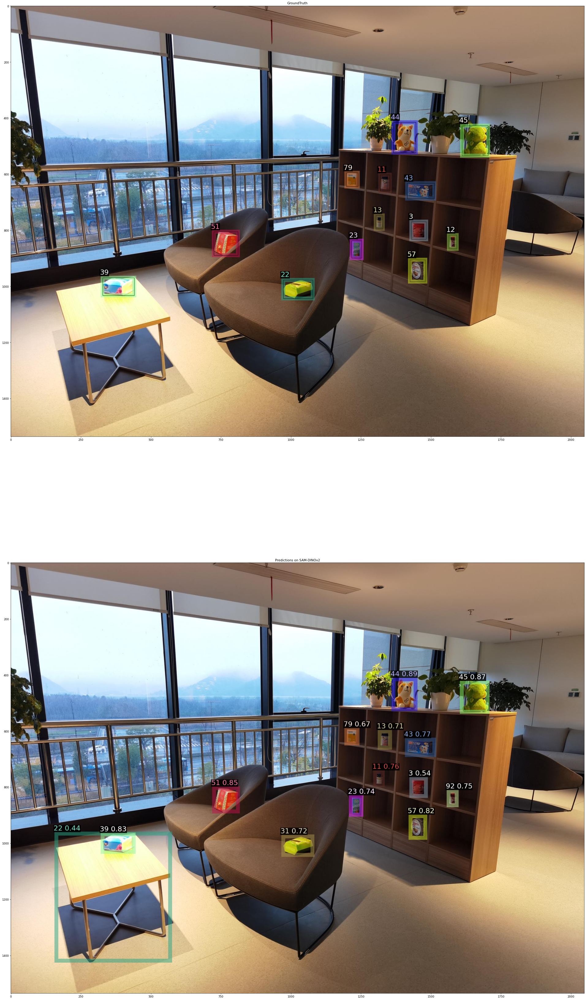

In [27]:
# In[12]:
fig = plt.figure(figsize=(30,60), dpi=64, facecolor='w', edgecolor='k')
ax = plt.subplot(211)
ax.set_title("GroundTruth")
plt.imshow(vis_gt.get_image()[:, :, :])
ax = plt.subplot(212)
ax.set_title("Predictions on SAM-DINOv2")
plt.imshow(vis_pred.get_image()[:, :, :])
plt.tight_layout()
# plt.savefig('./result_images/InsDet/'+base_name+'_SAM_DINOv2.png', dpi=300)
plt.show()

## IMG: 2

In [15]:
# =================================================================================================================
# Evaluation Result for single image

from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

# Load the ground truth COCO dataset
cocoGt = COCO('test_data/annotations/single_image_ground_truth_'+str(img_id)+'.json')

# Load your detection results
cocoDt = cocoGt.loadRes(os.path.join("coco_instances_results.json"))

# Create a COCOeval object by initializing it with the ground truth and detection results
cocoEval = COCOeval(cocoGt, cocoDt, 'bbox')

# Run the evaluation
cocoEval.evaluate()
cocoEval.accumulate()
cocoEval.summarize()

# 'bbox' specifies that we are doing evaluation for bounding box detection.
# You can change it to 'segm' for segmentation tasks.


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.654
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.692
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.692
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.625
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.654
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.654
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDet

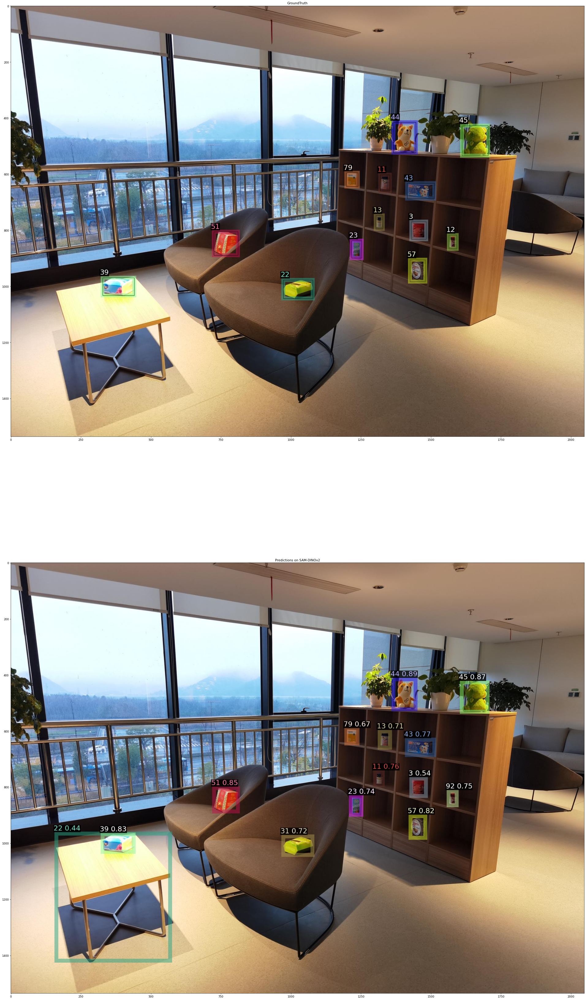

In [16]:
# In[12]:
fig = plt.figure(figsize=(30,60), dpi=64, facecolor='w', edgecolor='k')
ax = plt.subplot(211)
ax.set_title("GroundTruth")
plt.imshow(vis_gt.get_image()[:, :, :])
ax = plt.subplot(212)
ax.set_title("Predictions on SAM-DINOv2")
plt.imshow(vis_pred.get_image()[:, :, :])
plt.tight_layout()
# plt.savefig('./result_images/InsDet/'+base_name+'_SAM_DINOv2.png', dpi=300)
plt.show()